In [1]:
import scanpy as sc
import anndata as ad
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import os
os.chdir("/dcs04/lieber/lcolladotor/spatialHPC_LIBD4035/spatial_hpc")
os.getcwd()

'/dcs04/lieber/lcolladotor/spatialHPC_LIBD4035/spatial_hpc'

In [3]:
adata_filt = ad.read_h5ad("snRNAseq_hpc/python_analysis/processed-data/adata_qc-strict_scvi-2k-hdg_processed.h5")
adata_filt.shape #74216

(74216, 30790)

In [4]:
mdata = pd.read_csv("snRNAseq_hpc/python_analysis/processed-data/colData_EN-final.csv", index_col=2)
mdata.shape

(75411, 131)

In [5]:
adata_filt.obs['EN_final'] = adata_filt.obs.index.isin(mdata.index)
sum(adata_filt.obs['EN_final'])

64251

In [6]:
mdata['adata'] = mdata.index.isin(adata_filt.obs.index)
sum(mdata['adata'])

64251

In [7]:
i1 = mdata[mdata.adata].index
i2 = adata_filt.obs[adata_filt.obs.EN_final].index

In [21]:
adata_filt.obs.loc[i1,'fine_cell_class'] = mdata.loc[i1,"fine.cell.class"]
adata_filt.obs.loc[i1,'superfine_cell_class'] = mdata.loc[i1,"superfine.cell.class"].astype('str')

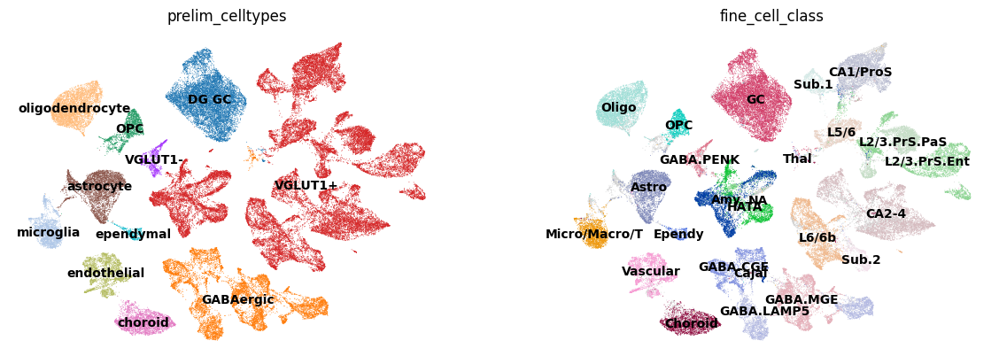

In [9]:
sc.pl.umap(adata_filt, color=["prelim_celltypes","fine_cell_class"],
           ncols=2, legend_loc="on data", frameon=False)

In [22]:
adata_nrn = adata_filt[adata_filt.obs['prelim_celltypes']=="VGLUT1+"]
adata_nrn = adata_nrn[~adata_nrn.obs['scvi_leiden_k10'].isin(["7","9","22"])]

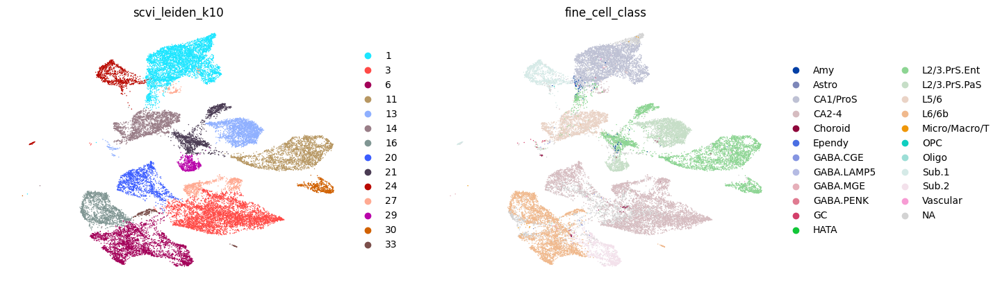

In [40]:
sc.pl.umap(adata_nrn, color=["scvi_leiden_k10","fine_cell_class"],
           ncols=2, frameon=False)

In [11]:
pd.set_option('display.max_rows', None)
adata_nrn.obs.groupby(['scvi_leiden_k10','fine_cell_class'], observed=True).size()

scvi_leiden_k10  fine_cell_class
1                Amy                  44
                 Astro                 2
                 CA1/ProS           3972
                 CA2-4                11
                 Choroid               3
                 GABA.LAMP5           10
                 GABA.MGE              9
                 GC                    4
                 HATA                  3
                 L2/3.PrS.Ent        165
                 L5/6                 11
                 Micro/Macro/T         3
                 Oligo                 3
                 Sub.1                15
                 Vascular              6
3                CA2-4              3314
                 Choroid              19
                 GABA.LAMP5            2
                 GC                    2
                 HATA                  1
                 L2/3.PrS.Ent          1
                 L2/3.PrS.PaS          2
                 L6/6b                 1
                 Sub.1  

In [23]:
adata_nrn.obs['g1'] = "TBD"
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10']=='1','g1'] = "CA1"
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10'].isin(['3','27']),'g1'] = "CA3 pyr"
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10']=='20','g1'] = "CA3 MC"
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10']=='24','g1'] = "SUB pyr"

/tmp/ipykernel_636607/2243396373.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_nrn.obs['g1'] = "TBD"


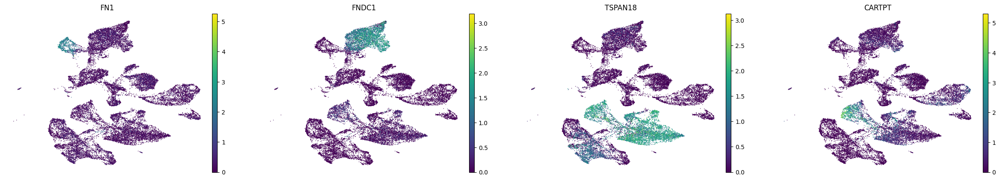

In [44]:
sc.pl.umap(adata_nrn, color=["FN1","FNDC1","TSPAN18","CARTPT"],
           ncols=4, frameon=False)

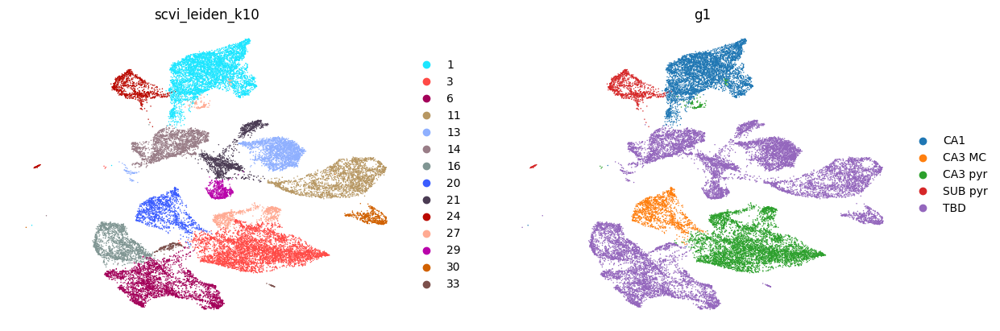

In [47]:
sc.pl.umap(adata_nrn, color=["scvi_leiden_k10","g1"],
           ncols=2, frameon=False)

In [24]:
adata_nrn.obs['g2'] = adata_nrn.obs['g1'].astype('str')
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10'].isin(['21','11','30']),'g2'] = "ProS pyr"
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10']=='29','g2'] = "ProS pyr (sup)"

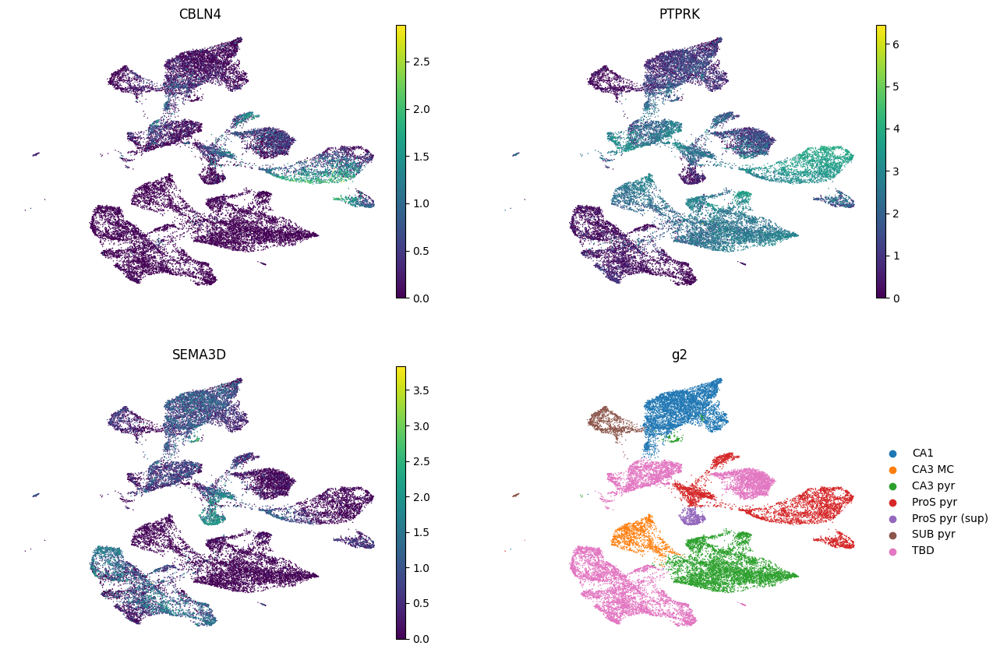

In [53]:
sc.pl.umap(adata_nrn, color=["CBLN4","PTPRK","SEMA3D","g2"],
           ncols=2, frameon=False)

In [25]:
adata_nrn.obs['g3'] = adata_nrn.obs['g1'].astype('str')
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10']=='21','g3'] = "ProS"
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10'].isin(['11','30']),'g3'] = "ProS pyr"
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10']=='29','g3'] = "ProS pyr (sup)"
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10']=='14','g3'] = "ProS pmo"
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10']=='16','g3'] = "SUB/ProS (dorsal)"

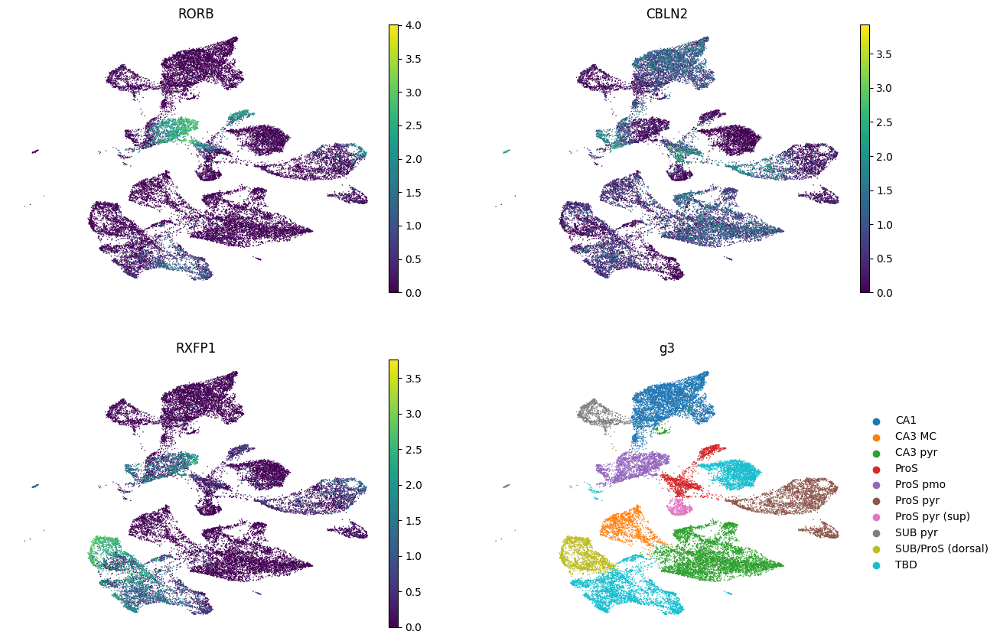

In [59]:
sc.pl.umap(adata_nrn, color=["RORB","CBLN2","RXFP1","g3"],
           ncols=2, frameon=False)

In [26]:
adata_nrn.obs['g4'] = adata_nrn.obs['g3'].astype('str')
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10'].isin(['6','33']),'g4'] = "SUB/ProS (deep)"

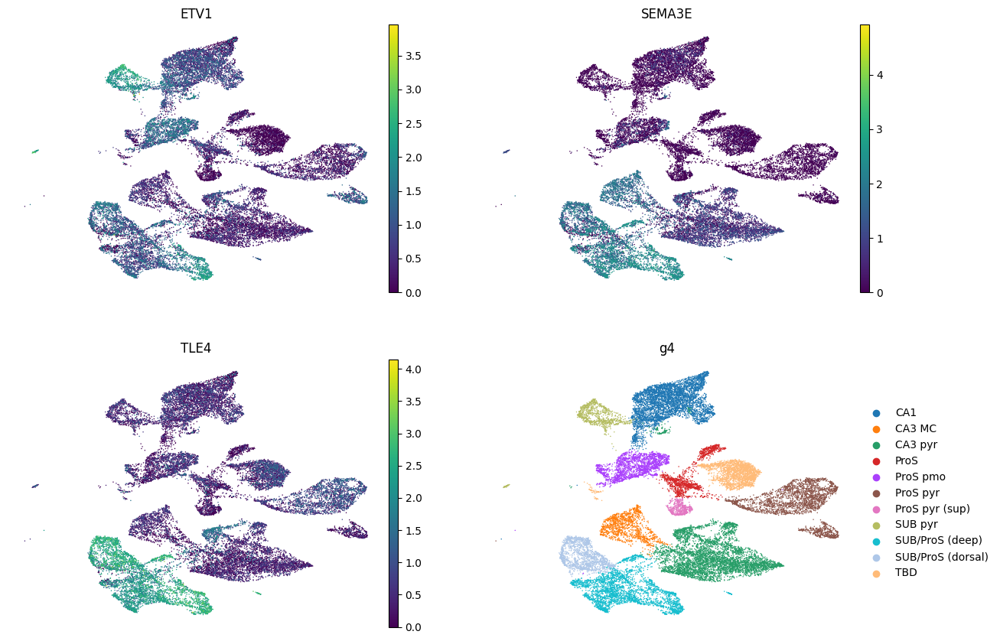

In [61]:
sc.pl.umap(adata_nrn, color=["ETV1","SEMA3E","TLE4","g4"],
           ncols=2, frameon=False)

In [27]:
adata_nrn.obs['g5'] = adata_nrn.obs['g4'].astype('str')
adata_nrn.obs.loc[adata_nrn.obs['scvi_leiden_k10']=='13','g5'] = "Pyr (sup)"

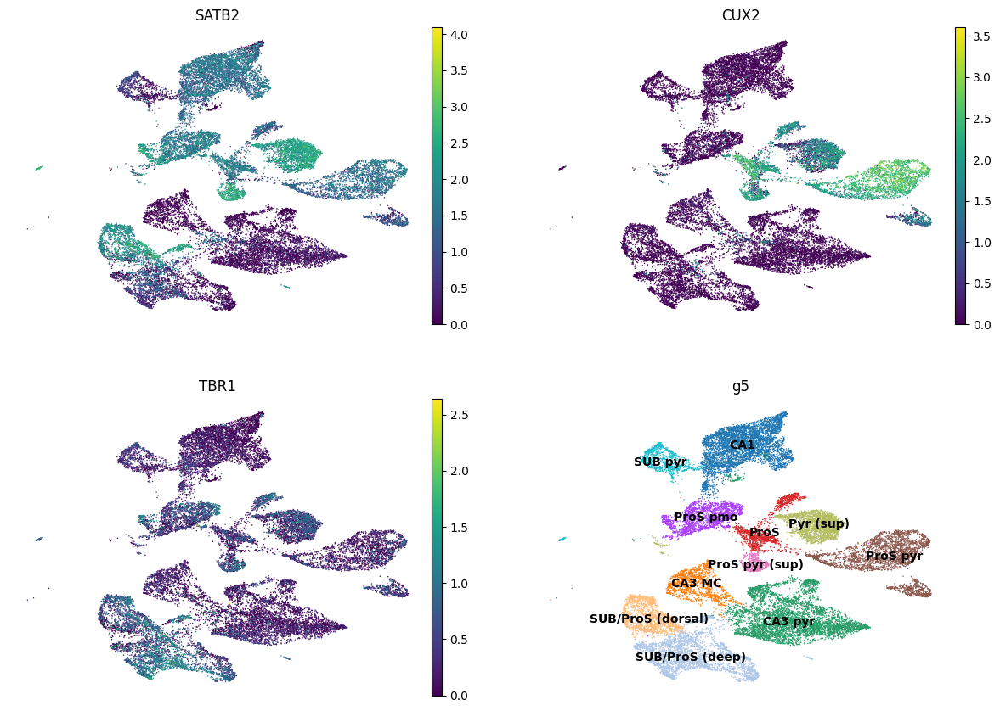

In [65]:
sc.pl.umap(adata_nrn, color=["SATB2","CUX2","TBR1","g5"],
           ncols=2, legend_loc="on data", frameon=False)

In [28]:
adata_nrn2 = adata_nrn[adata_nrn.obs['fine_cell_class'].isin(["CA1/ProS","CA2-4","L6/6b","Sub.2","L2/3.PrS.Ent","L2/3.PrS.PaS","L5/6","Sub.1"])]

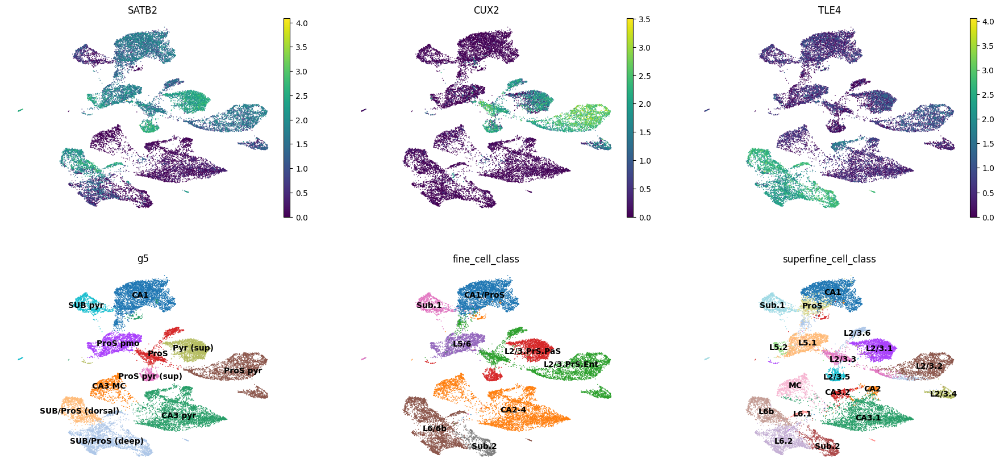

In [32]:
sc.pl.umap(adata_nrn2, color=["SATB2","CUX2","TLE4","g5","fine_cell_class","superfine_cell_class"],
           ncols=3, legend_loc="on data", frameon=False)

In [33]:
adata_nrn2.obs.groupby('g5', observed=True).size()

g5
CA1                  4174
CA3 MC                947
CA3 pyr              4135
ProS                 1091
ProS pmo             1933
ProS pyr             2841
ProS pyr (sup)        513
Pyr (sup)            2111
SUB pyr               961
SUB/ProS (deep)      2967
SUB/ProS (dorsal)    1394
dtype: int64

In [34]:
adata_nrn2.obs.groupby('fine_cell_class', observed=True).size()

fine_cell_class
CA1/ProS        4008
CA2-4           5080
L2/3.PrS.Ent    4147
L2/3.PrS.PaS    2598
L5/6            1922
L6/6b           3494
Sub.1            961
Sub.2            857
dtype: int64

In [35]:
adata_nrn2.obs.groupby(['brnum','fine_cell_class'], observed=True).size()

brnum   fine_cell_class
Br2720  CA1/ProS            207
        CA2-4               193
        L2/3.PrS.Ent        355
        L2/3.PrS.PaS        343
        L5/6                192
        L6/6b               226
        Sub.1                52
        Sub.2                56
Br2743  CA1/ProS           1106
        CA2-4                 1
        L2/3.PrS.Ent       1395
        L2/3.PrS.PaS         33
        L5/6                296
        L6/6b               513
        Sub.1               126
        Sub.2                58
Br3942  CA1/ProS            239
        CA2-4               273
        L2/3.PrS.Ent        504
        L2/3.PrS.PaS        202
        L5/6                340
        L6/6b               403
        Sub.1               106
        Sub.2               149
Br6423  CA1/ProS            168
        CA2-4                23
        L2/3.PrS.Ent        364
        L2/3.PrS.PaS         60
        L5/6                216
        L6/6b               418
        Sub.1   

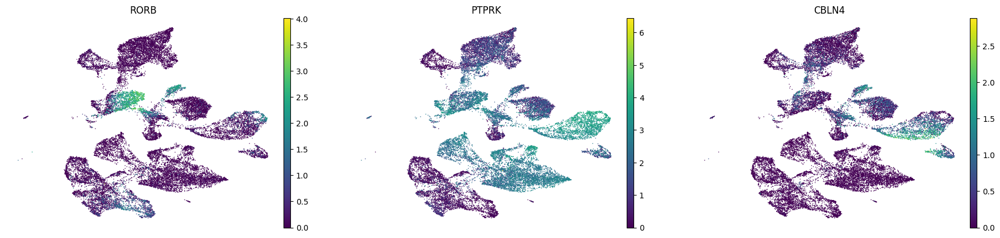

In [26]:
sc.pl.umap(adata_nrn, color=["RORB","PTPRK","CBLN4"],
           ncols=3, frameon=False)

In [3]:
adata = ad.read_h5ad("snRNAseq_hpc/python_analysis/processed-data/adata_qc-strict.h5")
adata.shape #81838

(81838, 36601)

In [4]:
sc.pp.filter_genes(adata, min_cells=50)
adata.shape

(81838, 30790)

In [5]:
# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)
# Saving log norm data
adata.layers["log1p_norm"] = adata.X.copy()

In [6]:
adata_hdg = ad.read_h5ad("snRNAseq_hpc/python_analysis/processed-data/adata_qc-strict_scvi-2k-hdg.h5")

In [7]:
exclude = ['7','18','23','32','33']
adata_hdg = adata_hdg[~adata_hdg.obs['scvi_leiden'].isin(exclude)]
exclude2 = (adata_hdg.obs.scvi_leiden=="8") & (adata_hdg.obs.brnum=="Br3942")
adata_hdg = adata_hdg[~exclude2]

In [8]:
adata = adata[adata_hdg.obs_names]
adata.shape

(74439, 30790)

In [9]:
adata.obs = adata_hdg.obs.copy()

In [10]:
adata.obsm = adata_hdg.obsm.copy()

In [11]:
adata.obsp = adata_hdg.obsp.copy()

In [26]:
adata.uns['neighbors'] = adata_hdg.uns['neighbors'].copy()

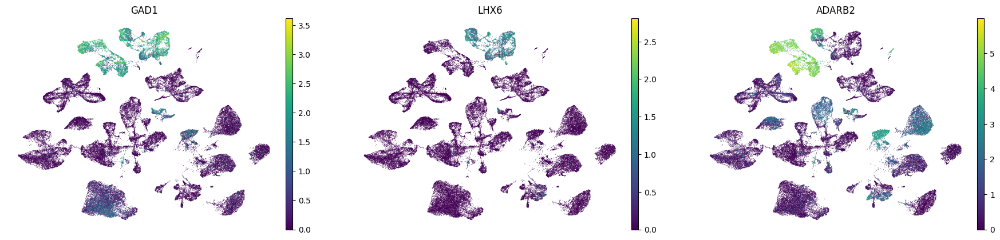

In [12]:
sc.pl.umap(adata, color=["GAD1","LHX6","ADARB2"],
           ncols=3, frameon=False)

In [15]:
adata_inh = adata[adata.obs['scvi_leiden'].isin(['6','10','21','22','25'])]

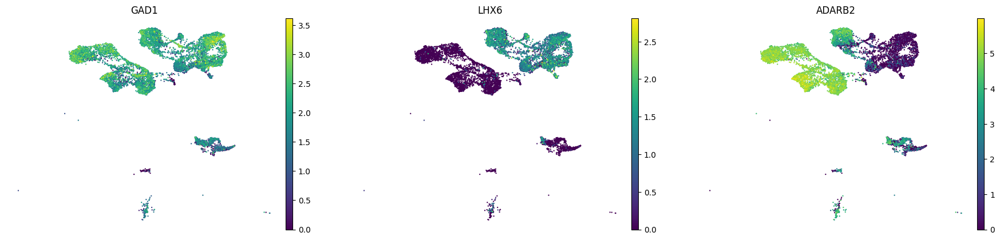

In [16]:
sc.pl.umap(adata_inh, color=["GAD1","LHX6","ADARB2"],
           ncols=3, frameon=False)

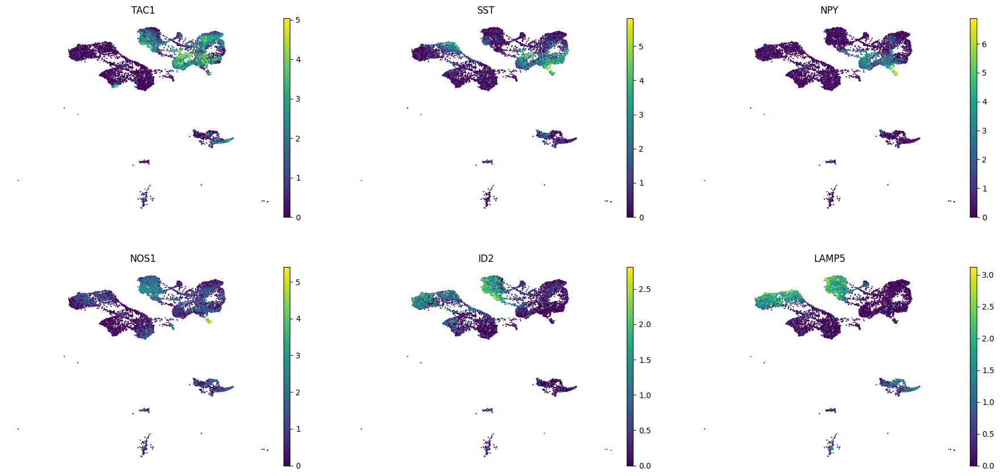

In [189]:
sc.pl.umap(adata_inh, color=["TAC1","SST","NPY","NOS1","ID2",
                             "LAMP5"],
           ncols=3, frameon=False)

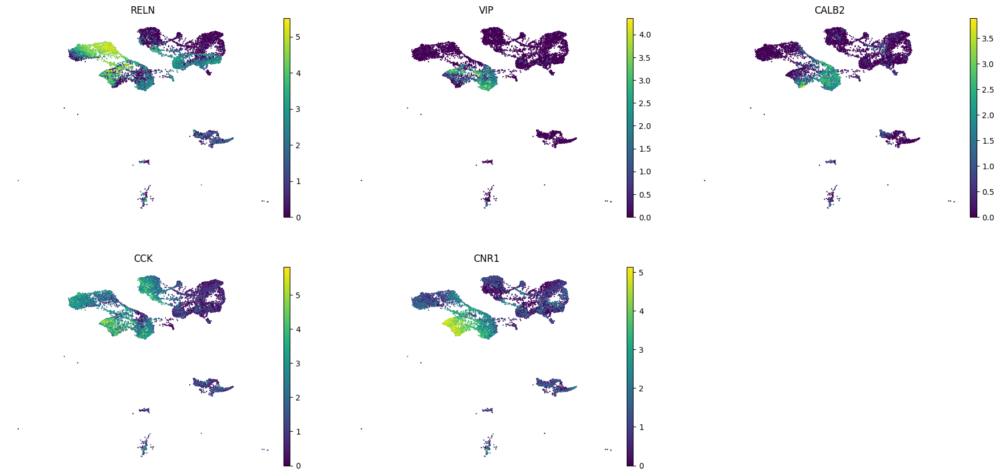

In [21]:
sc.pl.umap(adata_inh, color=["RELN","VIP","CALB2","CCK","CNR1"],
           ncols=3, frameon=False)
#ABI3BP = EXPRESSED IN POLYMORPHIC LAYER OF SUBICULUM https://www.cell.com/cell-reports/fulltext/S2211-1247(20)30601-X

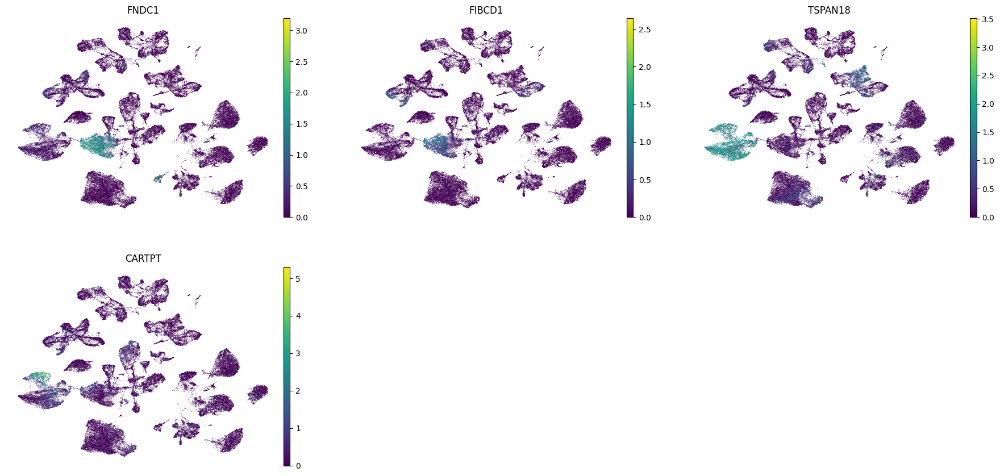

In [150]:
sc.pl.umap(adata, color=["FNDC1","TSPAN18","CARTPT"],
           ncols=3, frameon=False)
#FIBCD1 CA1 FIG S5 https://www.cell.com/cell/fulltext/S0092-8674(21)00501-8

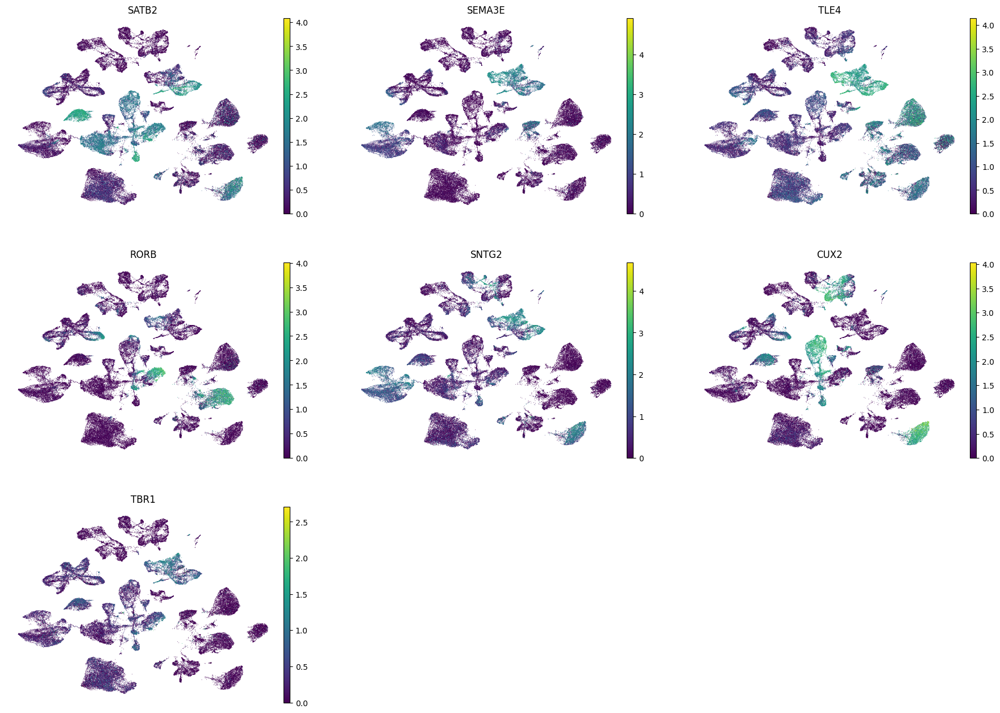

In [200]:
sc.pl.umap(adata, color=["SATB2","SEMA3E","TLE4","RORB","SNTG2","CUX2","TBR1"],
           ncols=3, frameon=False)
#SEMA3E = L2/3 MOSTLY, https://www.sciencedirect.com/science/article/pii/S1044743119301149
#LOOK UP SNTG2: SYNTROPHIN GAMMA 2
### SPECIFICALLY FOUND IN HIPPOCAMPAL PYRAMIDAL NEURONS AND CORTICAL NEURONS https://pubmed.ncbi.nlm.nih.gov/16857187/

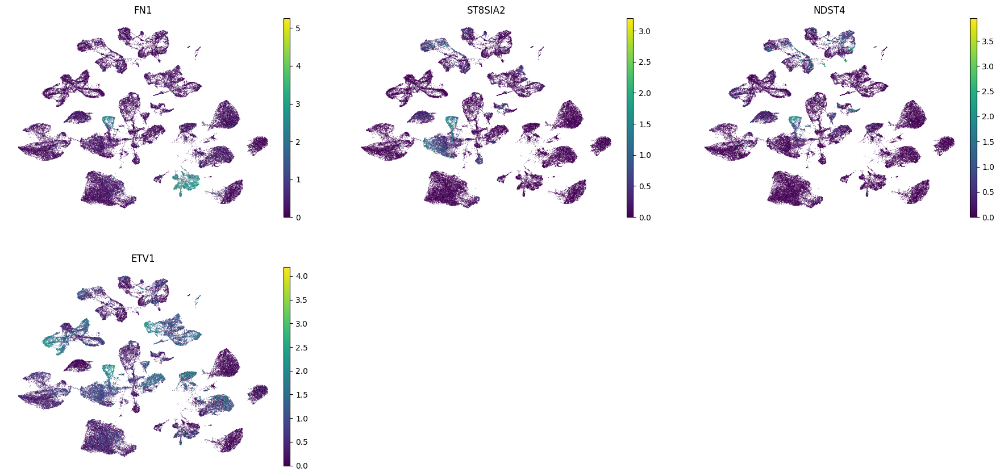

In [153]:
sc.pl.umap(adata, color=["FN1","ST8SIA2","NDST4","ETV1"],
           ncols=3, frameon=False)
#"ST8SIA2" DISTAL SUBICULUM PYRAMIDAL https://www.cell.com/cell-reports/fulltext/S2211-1247(20)30601-X
#NDST4 SAYS CA1 PYR
# EXT DATA HPF MARKERS SAYS NDST4 IS SUB https://www.cell.com/cell/fulltext/S0092-8674(21)00501-8
#ETV1 FIG S6A subiculum dorsal or distal
#FN1 FIG S5 https://www.cell.com/cell/fulltext/S0092-8674(21)00501-8

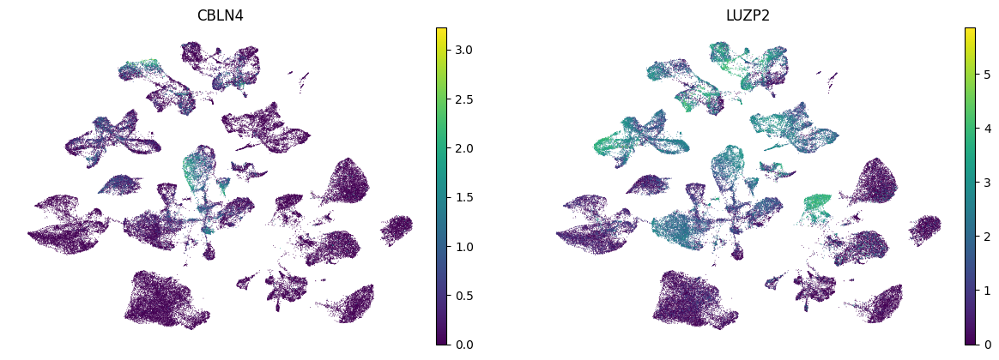

In [182]:
#SUPERFICIAL PYRAMIDAL LAYER OF SUBICULUM OR PROSUBICULUM https://www.cell.com/cell-reports/fulltext/S2211-1247(20)30601-X
sc.pl.umap(adata, color=["CBLN4","LUZP2"],
           ncols=3, frameon=False)
#CBLN4: PROSUBICULUM PYRAMIDAL, MOST SUPERFICIAL 
#LUZP2: RC4 is a small cluster with cells located in the superficial pyramidal layer of the ventral Sub bordering the PS https://www.cell.com/cell-reports/fulltext/S2211-1247(20)30601-X


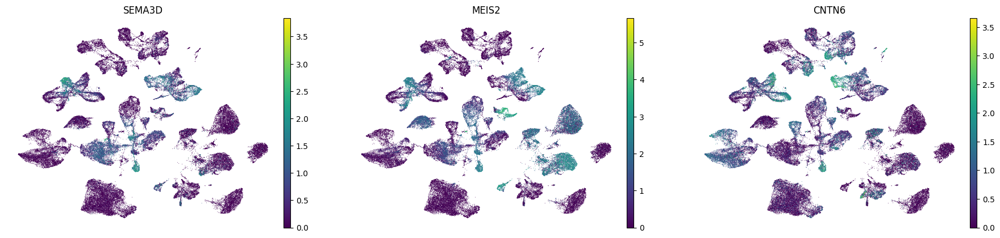

In [131]:
#PYRAMIDAL LAYER OF PROSUBICULUM TABLE S1 https://www.cell.com/cell-reports/fulltext/S2211-1247(20)30601-X
sc.pl.umap(adata, color=["SEMA3D","MEIS2","CNTN6"],
           ncols=3, frameon=False)
#SEMA3D: SUPERFICIAL, VENTRAL 
#MEIS2: SUPERFICIAL, DORSAL
#CNTN6: POLYMORPHIC LAYER OF SUBICULUM AND PROSUBICULUM

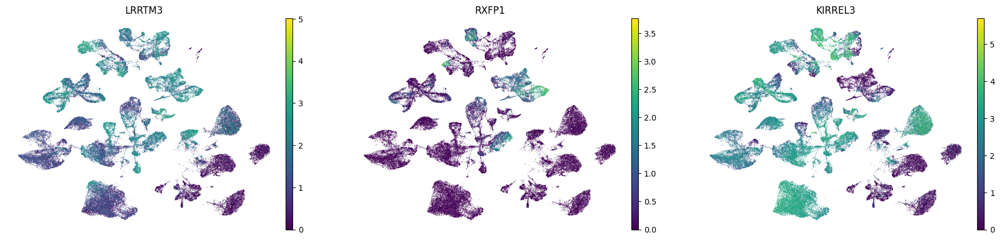

In [195]:
#MOSTLY FIG S5 https://www.cell.com/cell/fulltext/S0092-8674(21)00501-8
sc.pl.umap(adata, color=["LRRTM3","RXFP1","KIRREL3"],
           ncols=3, frameon=False)
#RXFP1 = MORE DORSAL THAN VENTRAL, DORSAL SUBICULUM/PROSUBICULUM
#LRRTM3 = MORE DISTAL THAN PROXIMAL FIG S5 https://www.cell.com/cell/fulltext/S0092-8674(21)00501-8
#KIRREL3 = MORE VENTRAL THAN DORSAL
#SAMD5 = MORE DORSAL THAN VENTRAL; FIG S5 SHOWS AS MARKER FOR CLUSTERS 318-328 (WHICH FIG 1 LABELS AS PROS/SUB)

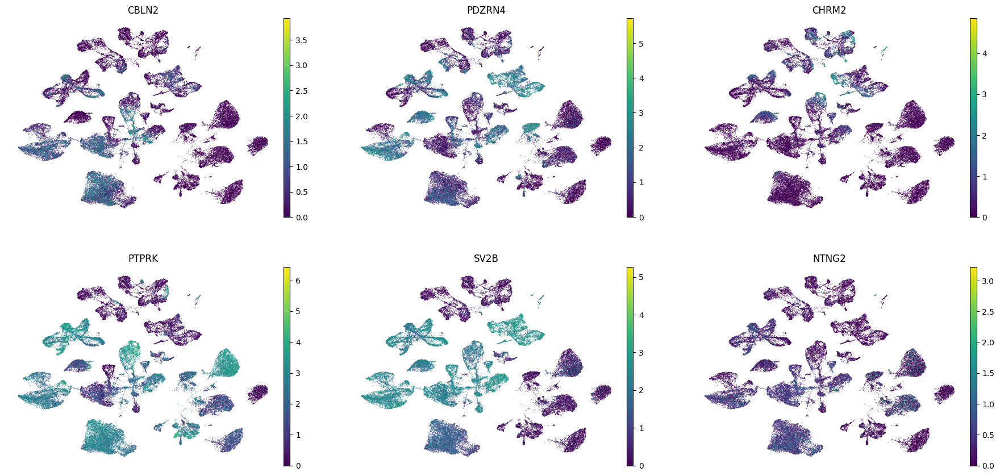

In [196]:
sc.pl.umap(adata, color=["CBLN2",#POLYMORPHIC SUBICULUM AND PROSUBICULUM?
                         "PDZRN4","CHRM2","PTPRK","SV2B"],#COL25A1
           ncols=3, frameon=False)
#PTPRK TABLES1 SAYS CA1 PYRAMIDAL
#PDZRN4: POLYMORPHIC LAYER OF SUBICULUM
#CHRM2: POLYMORPHIC LAYER OF PROSUBICULUM TABLE S1 https://www.cell.com/cell-reports/fulltext/S2211-1247(20)30601-X 

In [27]:
sc.tl.leiden(adata, key_added="scvi_leiden_res8", resolution=0.8)

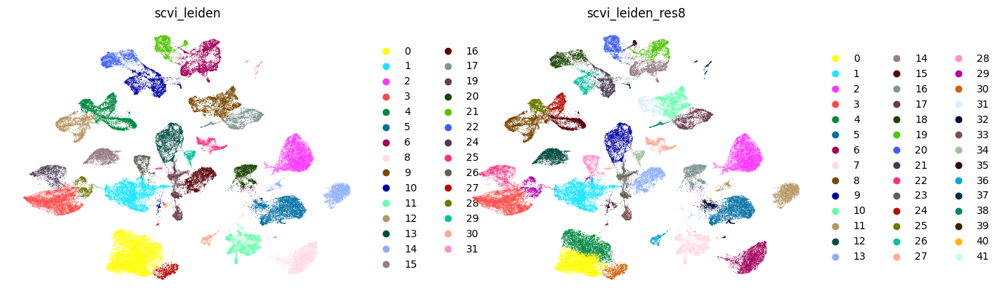

In [28]:
sc.pl.umap(adata, color=["scvi_leiden","scvi_leiden_res8"],
           ncols=2, frameon=False)